## Дипломная работа

_Преподаватель: Вячеслав Потапов_

### Дипломная работа по курсу «Python для анализа данных»

1. Загрузить файл hr.csv

2. Рассчитать основные статистики для переменных (среднее, медиана, мода, мин/макс, сред.отклонение)

3. Рассчитать и визуализировать корреляционную матрицу для переменных

4. Визуализировать несколько взаимосвязей между переменными

5. С использованием t-test статистики проверить взаимосвязи между несколькими переменными

6. Рассчитать сколько работников работает в каждом департаменте

7. Показать распределение сотрудников по зарплатам

8. Показать распределение сотрудников по зарплатам совместно с департаментами

9. Сколько сотрудников покинули компанию

10. Проверить несколько гипотез для данных, чтобы понять почему сотрудники покидают компанию

11. Загрузить результат (в формате .ipynb ноутбука) в репозиторий. Разместить ссылку на репозиторий в Личном кабинете

### Описание dataset "HR.csv"

**satisfaction_level** – уровень удовлетворенности

**last_evaluation** – последняя оценка

**number_project** – номер проекта

**average_montly_hours** – средние часы в месяц

**time_spend_company** – стаж в компании (лет)

**Work_accident** – несчастный случай на работе

**left** – уволен

**promotion_last_5years** – повышения за последние 5 лет

**sales** – отдел

**salary** – зарплата

===========================
#### Импорт необходимых библиотек

In [1]:
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

# Базовая настройка plt и sns
large = 12; med = 9; small = 6
params = {'axes.titlesize': large,
          'legend.fontsize': med,
          'figure.figsize': (10, 5),
          'figure.dpi': 120.0,
          'axes.labelsize': med,
          'axes.titlesize': med,
          'xtick.labelsize': med,
          'ytick.labelsize': med,
          'figure.titlesize': large}
plt.rcParams.update(params)
plt.style.use('seaborn-whitegrid')
sns.set_style("white")

### Задача 1: Загрузить файл hr.csv

In [2]:
data_set = pd.read_csv('HR.csv')

In [3]:
data_set.sample(5)

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,sales,salary
3155,1.00,0.89,3,194,3,0,0,0,sales,medium
12180,0.40,0.47,2,146,3,0,1,0,sales,medium
8936,0.98,0.50,3,198,3,0,0,0,marketing,medium
13194,0.43,0.51,5,168,4,0,0,0,product_mng,medium
12795,0.61,0.98,2,238,4,0,0,0,support,medium


**Общая информация о DataSet**

In [4]:
data_set.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   satisfaction_level     14999 non-null  float64
 1   last_evaluation        14999 non-null  float64
 2   number_project         14999 non-null  int64  
 3   average_montly_hours   14999 non-null  int64  
 4   time_spend_company     14999 non-null  int64  
 5   Work_accident          14999 non-null  int64  
 6   left                   14999 non-null  int64  
 7   promotion_last_5years  14999 non-null  int64  
 8   sales                  14999 non-null  object 
 9   salary                 14999 non-null  object 
dtypes: float64(2), int64(6), object(2)
memory usage: 2.7 MB


**Выводы:**

– во всех колонках отсутствуют "пустые" значения

– колонки "sales", "salary" содержать не числовые категориальные значения

### Задача 2: Рассчитать основные статистики для переменных (среднее, медиана, мода, мин/макс, сред.отклонение)

**Основные статистики (табличное представление)**

In [5]:
data_set.describe()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years
count,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000,14999.000000
mean,0.612834,0.716102,3.803054,201.050337,3.498233,0.144610,0.238083,0.021268
std,0.248631,0.171169,1.232592,49.943099,1.460136,0.351719,0.425924,0.144281
min,0.090000,0.360000,2.000000,96.000000,2.000000,0.000000,0.000000,0.000000
25%,0.440000,0.560000,3.000000,156.000000,3.000000,0.000000,0.000000,0.000000
50%,0.640000,0.720000,4.000000,200.000000,3.000000,0.000000,0.000000,0.000000
75%,0.820000,0.870000,5.000000,245.000000,4.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,7.000000,310.000000,10.000000,1.000000,1.000000,1.000000


**Основные статистики (графическое представление)**

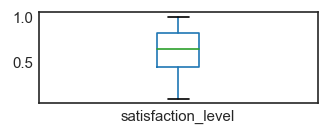

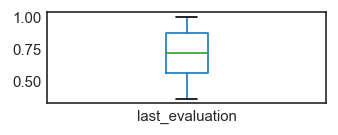

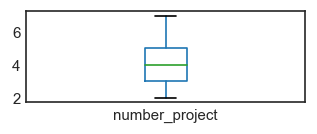

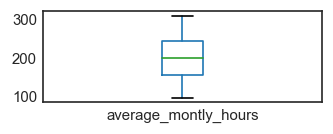

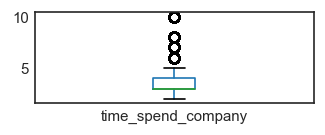

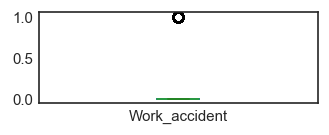

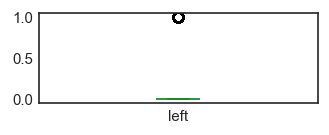

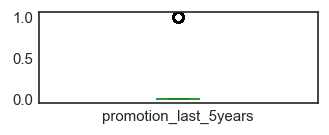

In [6]:
params = {'figure.figsize': (3, 1)}
plt.rcParams.update(params)

for i in range(1, 9):
    data_set.iloc[:, i-1:i].plot.box()
    plt.show()

In [7]:
print('Количество уникальных значений в столбце:')
for name_col in data_set.columns:
    print(f'– {name_col}: {len(data_set[name_col].unique().tolist())}')

Количество уникальных значений в столбце:
– satisfaction_level: 92
– last_evaluation: 65
– number_project: 6
– average_montly_hours: 215
– time_spend_company: 8
– Work_accident: 2
– left: 2
– promotion_last_5years: 2
– sales: 10
– salary: 3


In [8]:
print('Перечень уникальных значений в столбце:')
for name_col in data_set.columns[5:10].tolist():
    print(f'– {name_col}: {data_set[name_col].unique().tolist()}')

Перечень уникальных значений в столбце:
– Work_accident: [0, 1]
– left: [1, 0]
– promotion_last_5years: [0, 1]
– sales: ['sales', 'accounting', 'hr', 'technical', 'support', 'management', 'IT', 'product_mng', 'marketing', 'RandD']
– salary: ['low', 'medium', 'high']


**Выводы:**

– колонки "Work_accident", "left", "promotion_last_5years" содержат булевые значения 0 и 1

– колонки "sales", "salary" содержать не числовые категориальные значения

**Приводим данные к корректным типам**

In [9]:
convert_dict = {
    'satisfaction_level': float,
    'last_evaluation': float,
    'number_project': int,
    'average_montly_hours': int,
    'time_spend_company': int,
    'Work_accident': bool,
    'left': bool,
    'promotion_last_5years': bool,
    'sales': str,
    'salary': str    
}

data_set = data_set.astype(convert_dict)

In [10]:
data_set.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14999 entries, 0 to 14998
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   satisfaction_level     14999 non-null  float64
 1   last_evaluation        14999 non-null  float64
 2   number_project         14999 non-null  int64  
 3   average_montly_hours   14999 non-null  int64  
 4   time_spend_company     14999 non-null  int64  
 5   Work_accident          14999 non-null  bool   
 6   left                   14999 non-null  bool   
 7   promotion_last_5years  14999 non-null  bool   
 8   sales                  14999 non-null  object 
 9   salary                 14999 non-null  object 
dtypes: bool(3), float64(2), int64(3), object(2)
memory usage: 2.4 MB


In [11]:
data_set.sample(5)

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,sales,salary
9360,0.75,0.55,5,204,3,False,False,False,support,low
3637,0.55,0.41,4,132,5,True,False,False,support,medium
13508,0.14,0.58,4,275,10,False,False,False,sales,medium
1728,0.23,0.70,5,168,4,False,True,False,support,low
6142,0.49,0.83,4,194,3,False,False,False,technical,medium


### Задача 3: Рассчитать и визуализировать корреляционную матрицу для переменны

Корреляционную матрицу имеет смысл строить только для "числовых" столбцов

**Рассчитывае корреляционную матрицу**

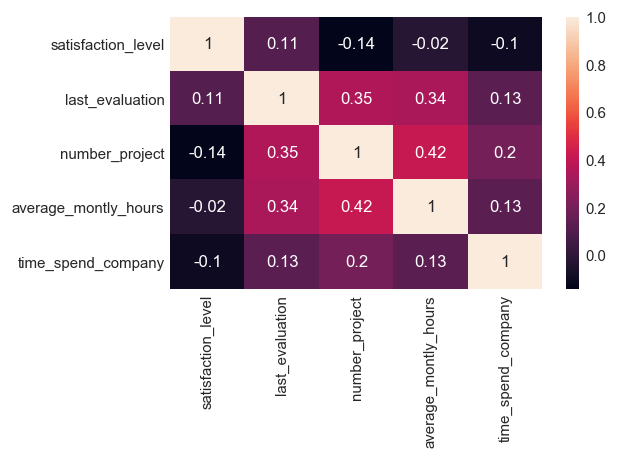

In [12]:
params = {'figure.figsize': (5, 3)}
plt.rcParams.update(params)

sns.heatmap(np.round_(data_set.iloc[:, :5].corr(), decimals=2), annot=True)
plt.show()

Корреляция между данными или практически отсутствует или очень низкая (average_montly_hours и number_project)

#### Все отделы: 'sales', 'accounting', 'hr', 'technical', 'support', 'management', 'IT', 'product_mng', 'marketing', 'RandD'

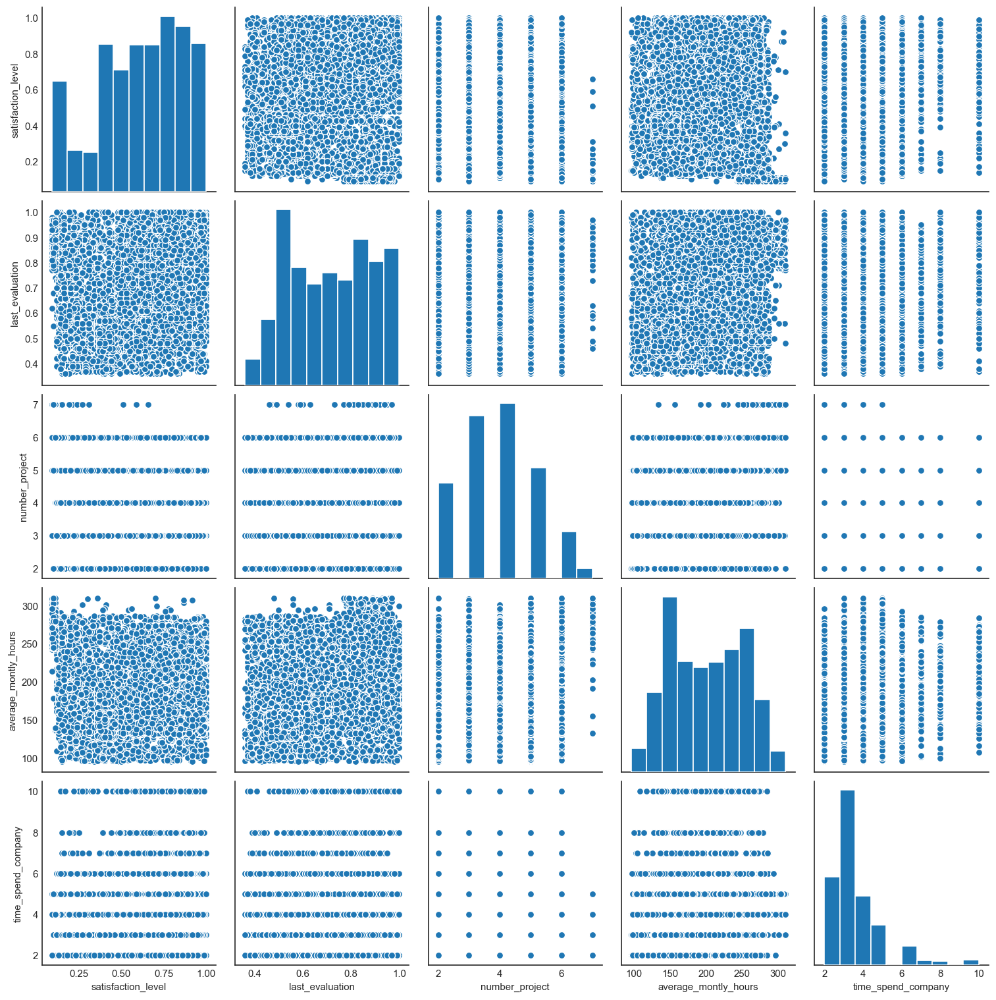

In [13]:
sns.pairplot(data_set, vars=data_set.columns[:5].tolist())
plt.show()

#### Все отделы: 'sales', 'accounting', 'hr', 'technical', 'support', 'management', 'IT', 'product_mng', 'marketing', 'RandD', с учетом уровня зарплаты ("salary")

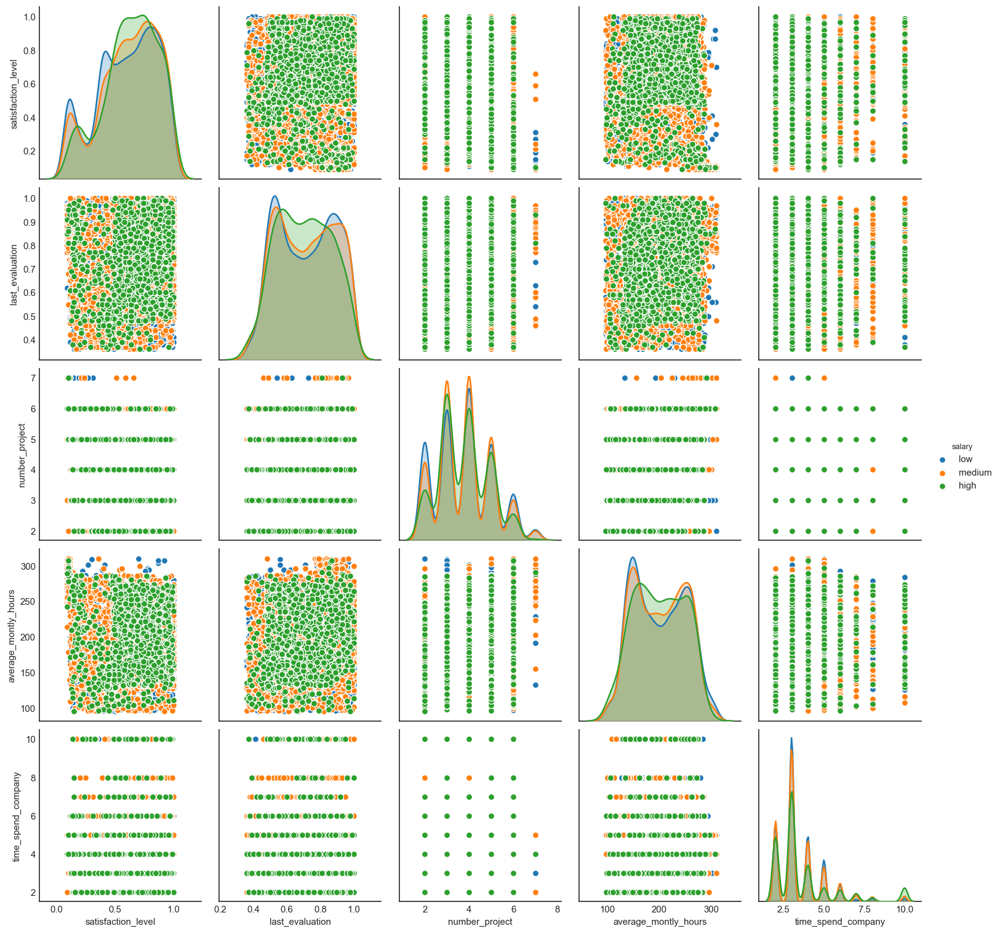

In [14]:
sns.pairplot(data_set, hue='salary', vars=data_set.columns[:5].tolist())
plt.show()

#### В разрезе отделов


В разрезе отдела "sales" с учетом уровня зарплаты ("salary")


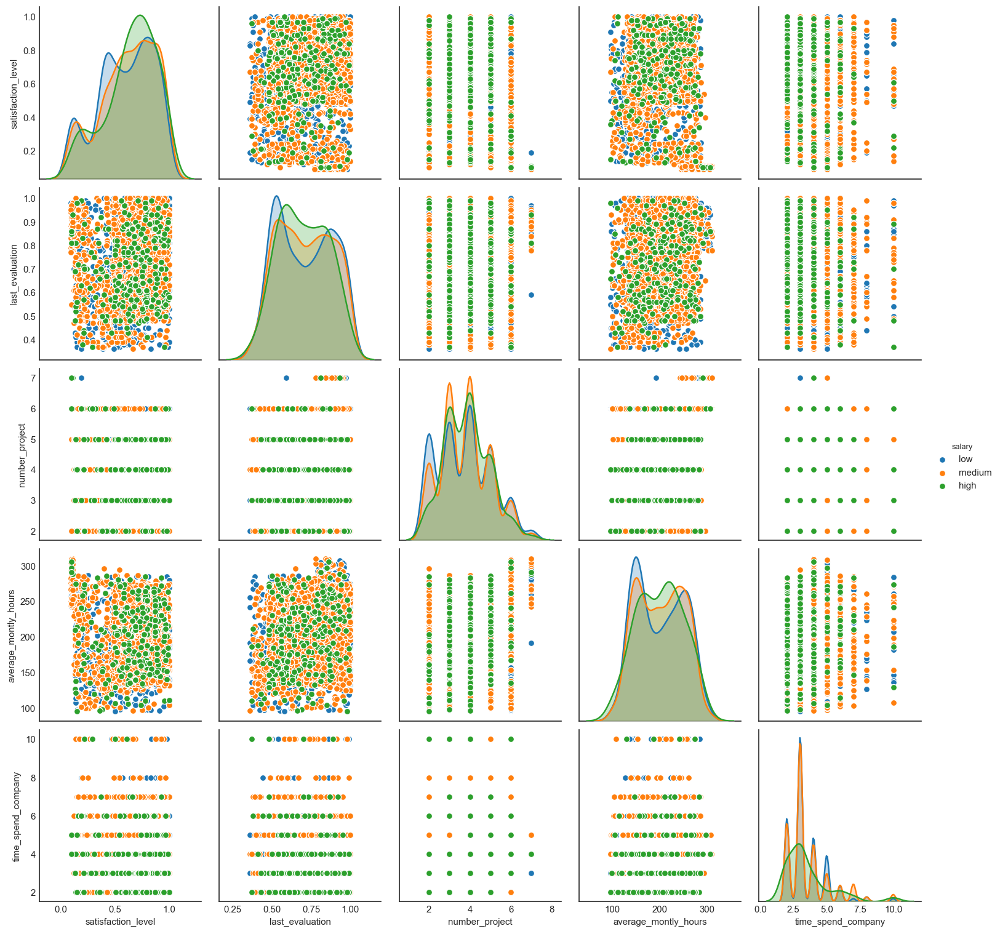


В разрезе отдела "accounting" с учетом уровня зарплаты ("salary")


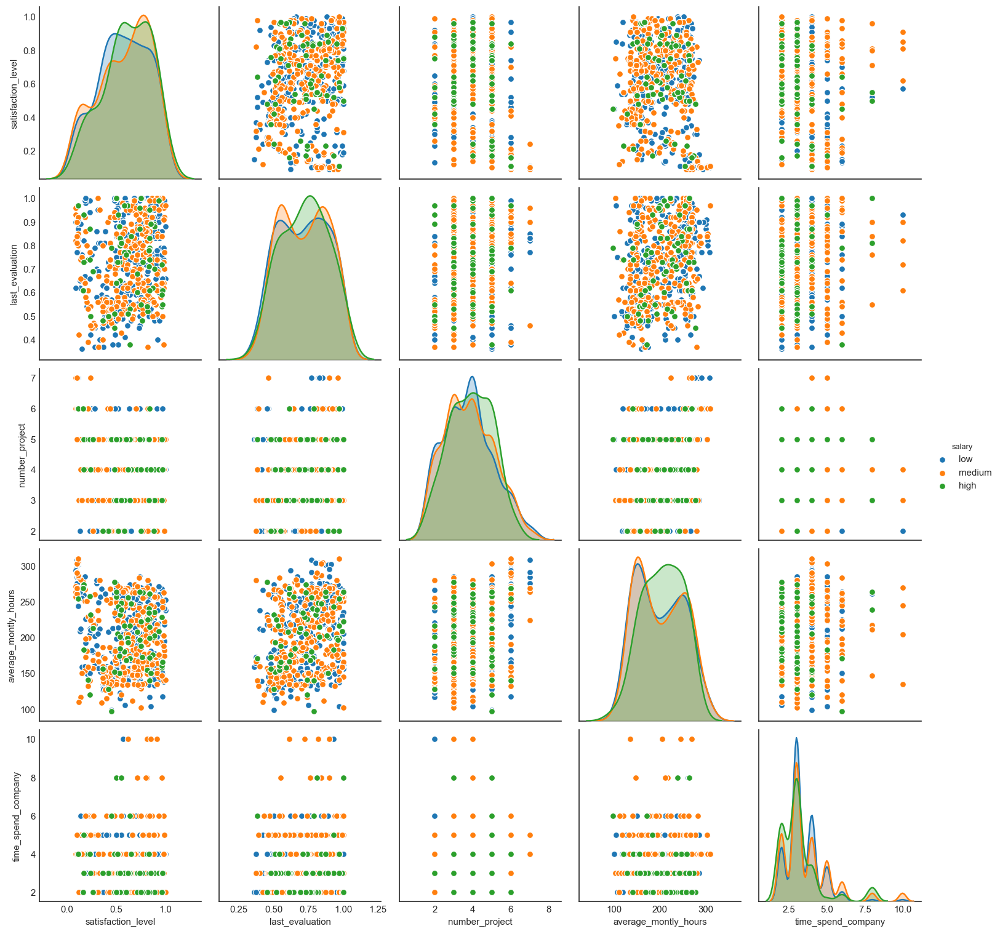


В разрезе отдела "hr" с учетом уровня зарплаты ("salary")


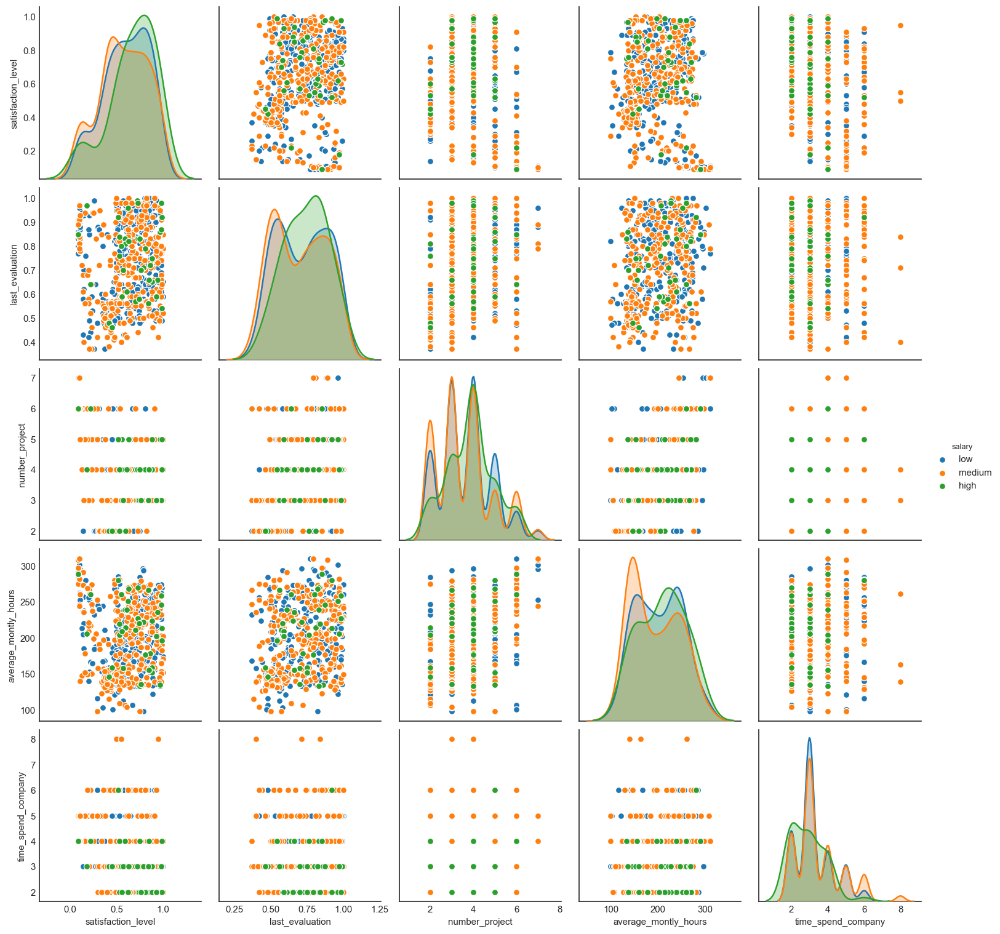


В разрезе отдела "technical" с учетом уровня зарплаты ("salary")


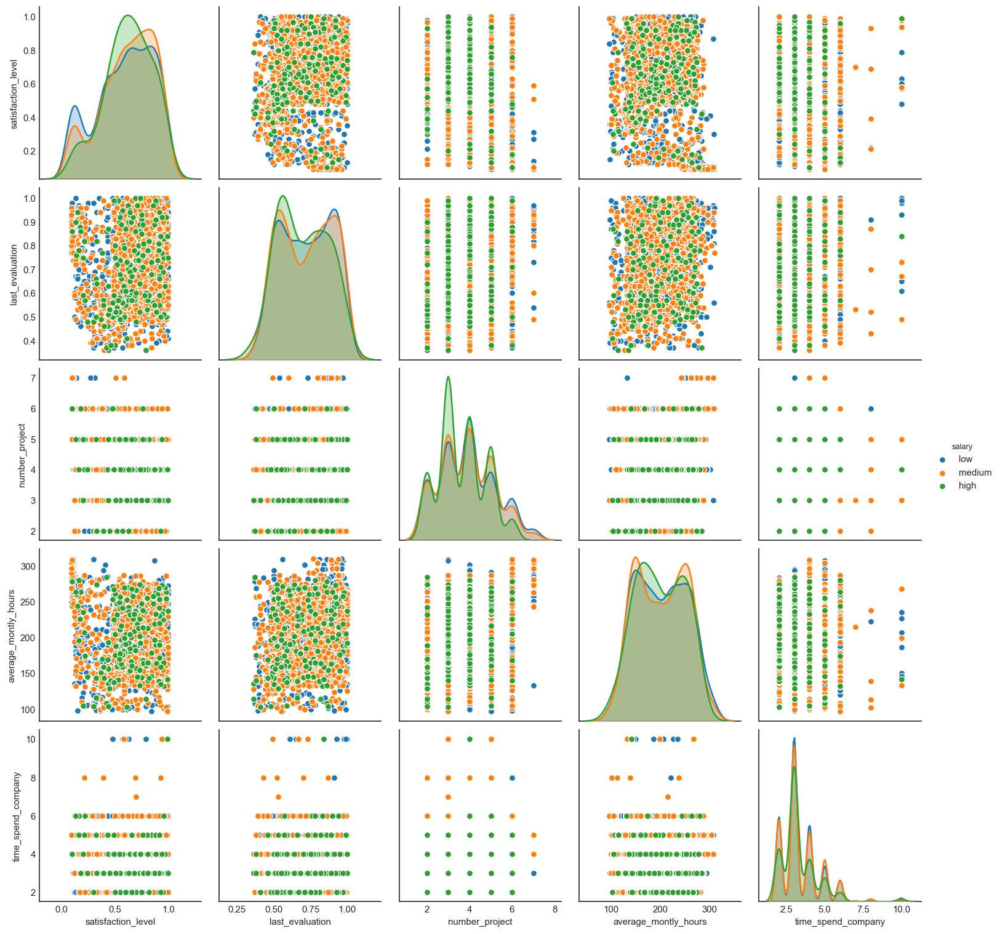


В разрезе отдела "support" с учетом уровня зарплаты ("salary")


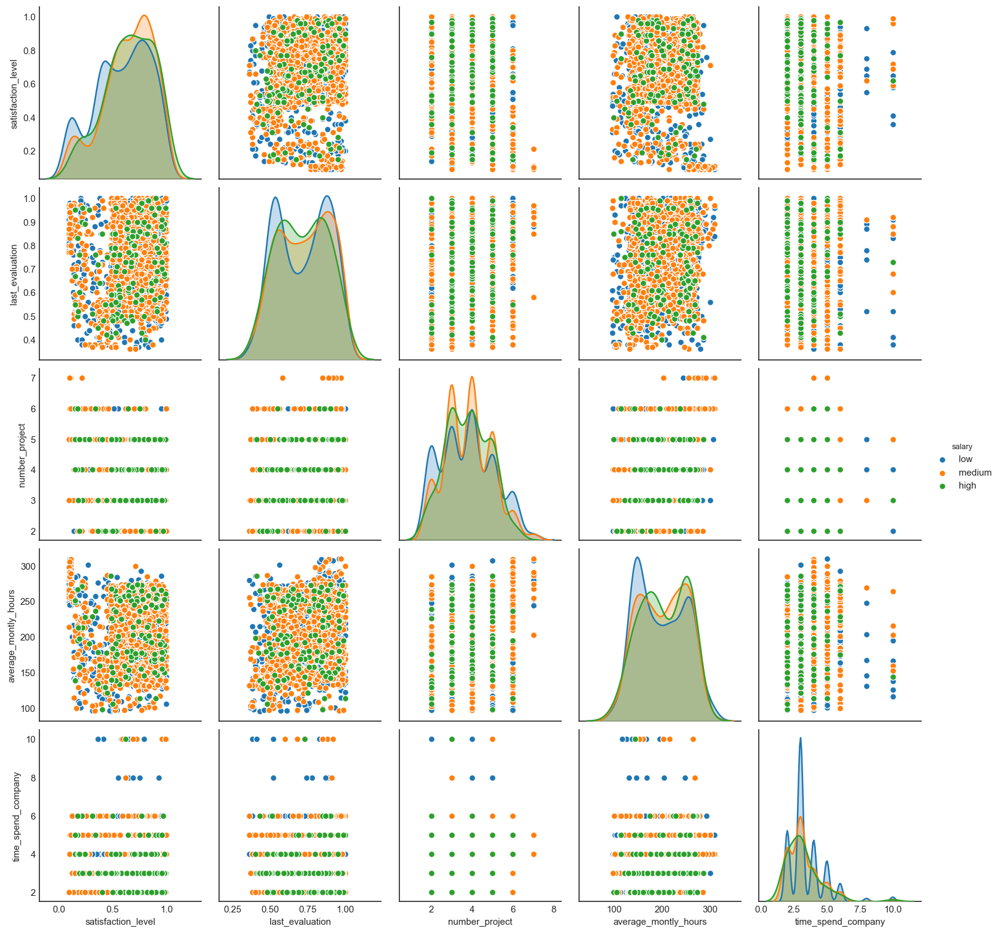


В разрезе отдела "management" с учетом уровня зарплаты ("salary")


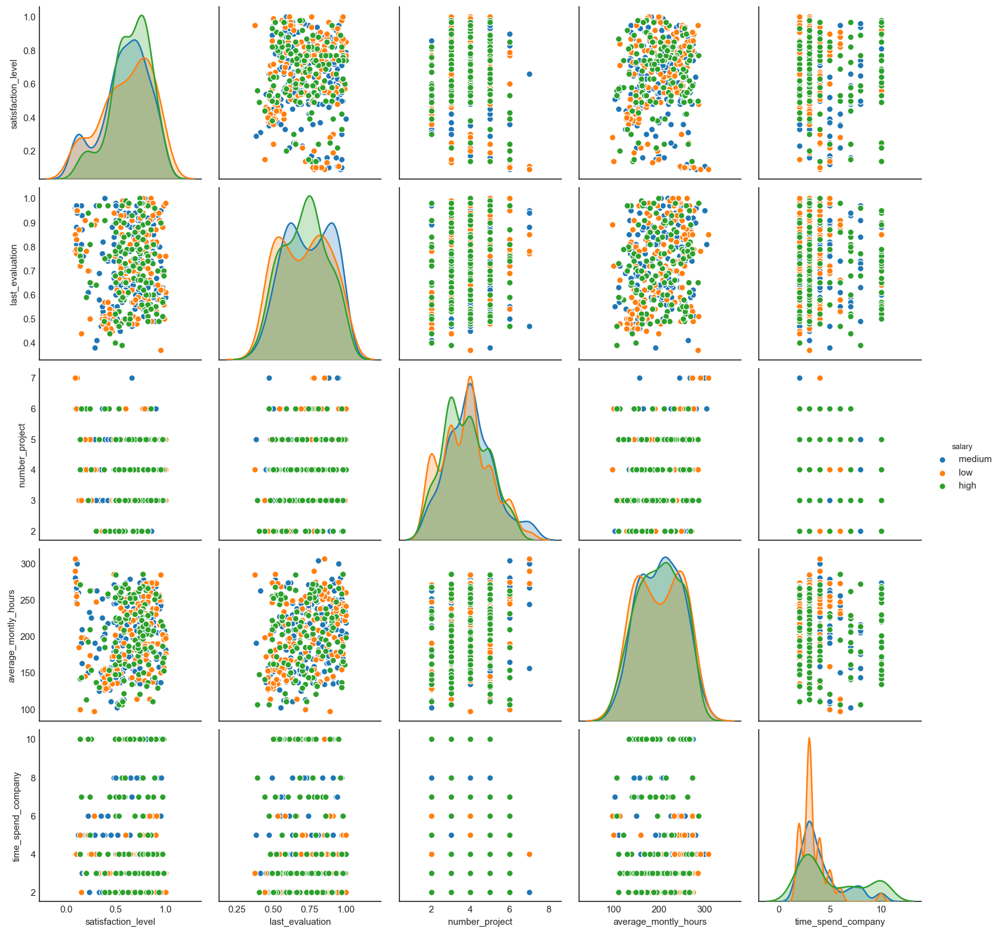


В разрезе отдела "IT" с учетом уровня зарплаты ("salary")


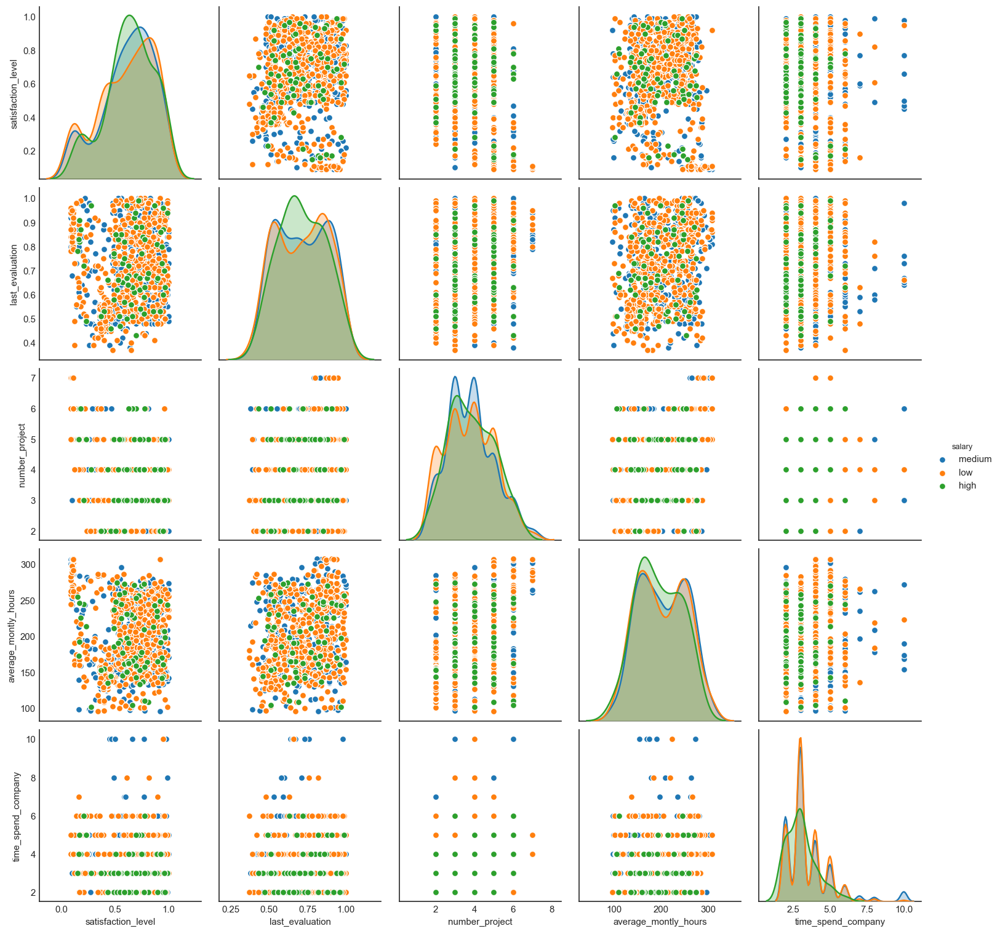


В разрезе отдела "product_mng" с учетом уровня зарплаты ("salary")


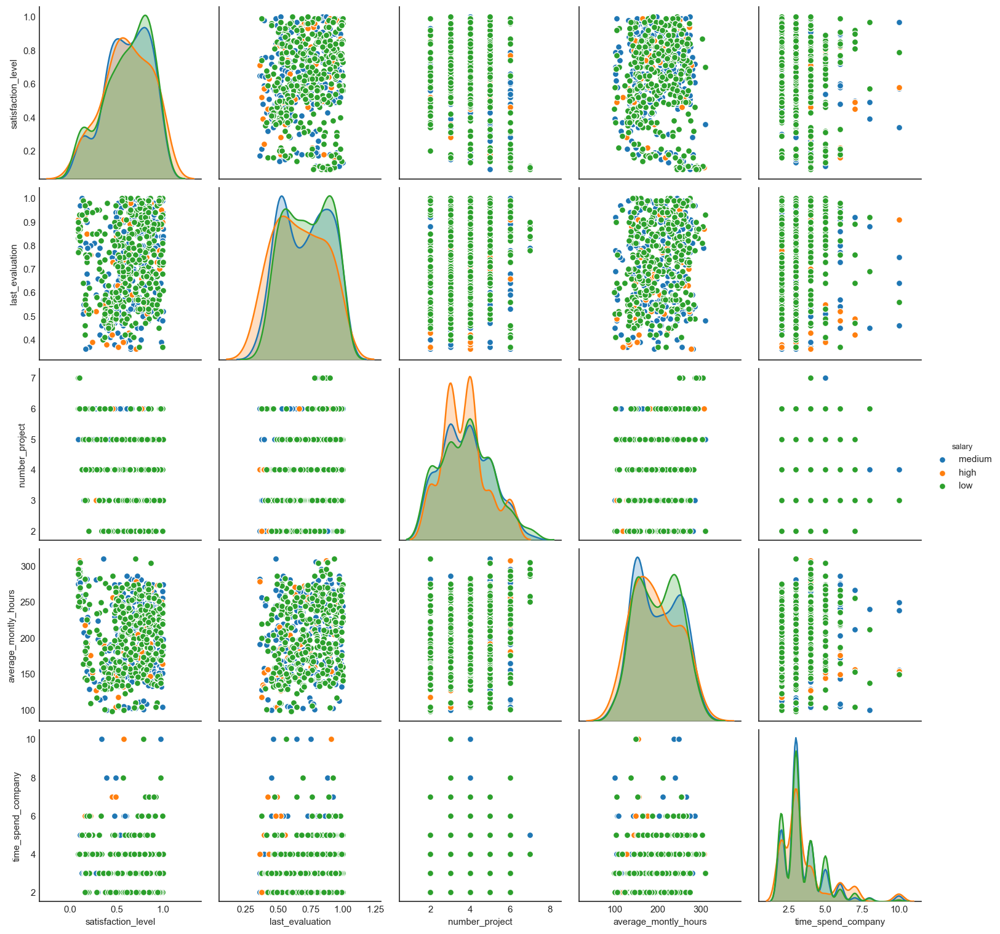


В разрезе отдела "marketing" с учетом уровня зарплаты ("salary")


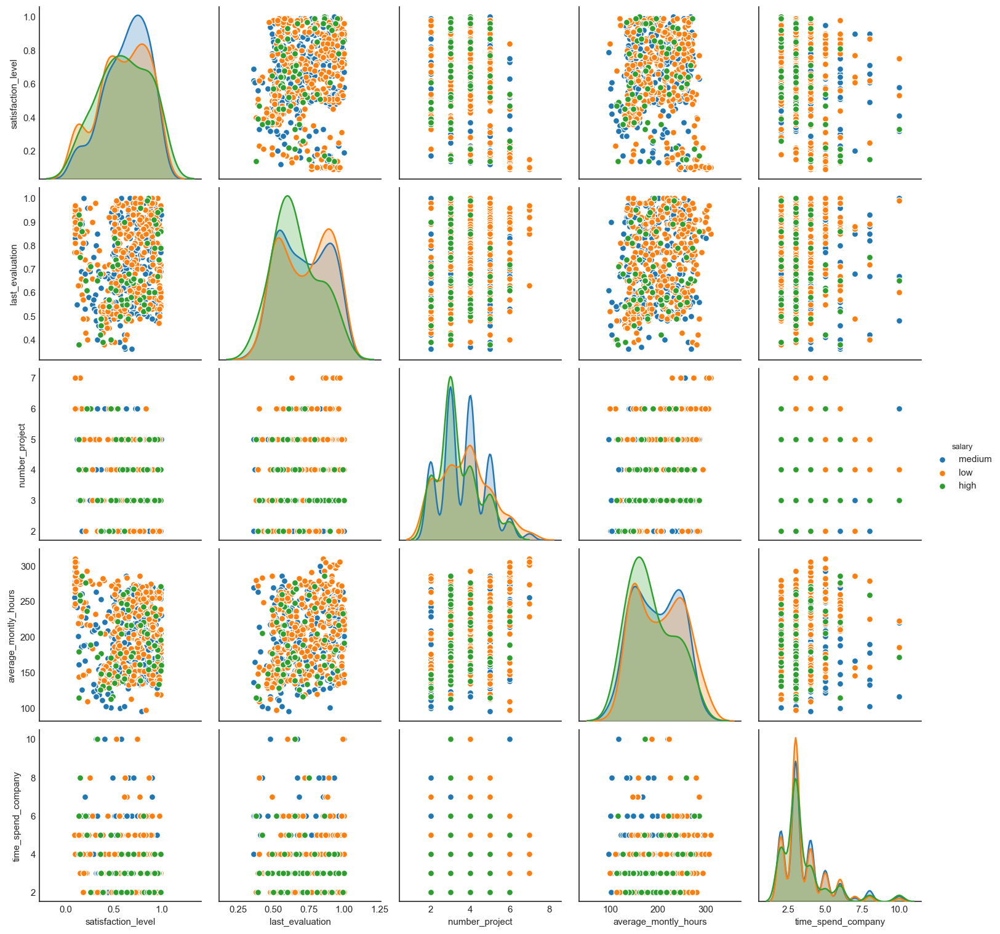


В разрезе отдела "RandD" с учетом уровня зарплаты ("salary")


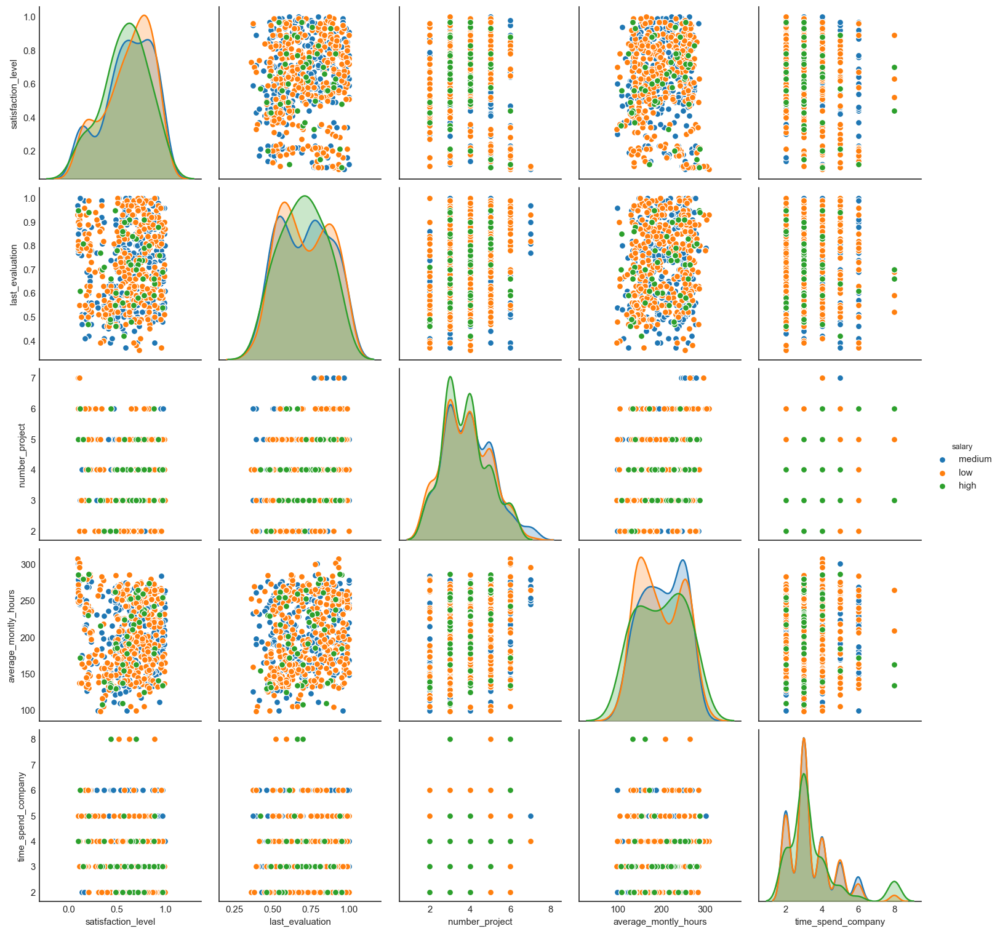

In [15]:
for dep in data_set['sales'].unique().tolist():
    print(f'\nВ разрезе отдела "{dep}" с учетом уровня зарплаты ("salary")')
    sns.pairplot(data_set[data_set['sales'] == dep], hue='salary', vars=data_set.columns[:5].tolist())
    plt.show()

### Задача 4: Визуализировать несколько взаимосвязей между переменными

**Зависимость уровня удовлетворенности от стажа работы в компании (в годах)**

Зависимость уровня удовлетворенности от стажа работы в компании (в годах)


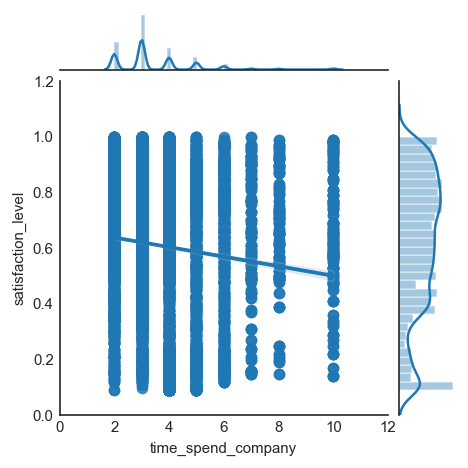

In [16]:
print('Зависимость уровня удовлетворенности от стажа работы в компании (в годах)')
sns.jointplot('time_spend_company', 'satisfaction_level', data=data_set,
              kind='reg', 
              xlim=(0, 12), ylim=(0, 1.2),
              height=4)
plt.show()

Зависимость уровня удовлетворенности от стажа работы в компании (в годах) с учетом уровня зарплалты ("salary")


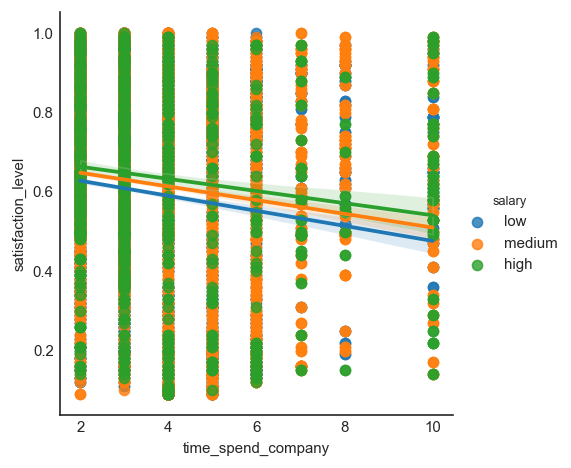

In [17]:
print('Зависимость уровня удовлетворенности от стажа работы в компании (в годах) с учетом уровня зарплалты ("salary")')
sns.lmplot(x='time_spend_company', y='satisfaction_level',
           hue='salary', height=4,
           data=data_set)
plt.show()

Зависимость уровня удовлетворенности от стажа работы в компании (в годах) с учетом отдела ("sales")


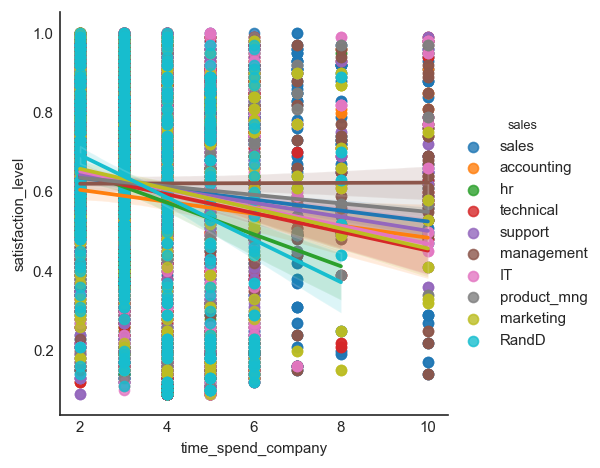

In [18]:
print('Зависимость уровня удовлетворенности от стажа работы в компании (в годах) с учетом отдела ("sales")')
sns.lmplot(x='time_spend_company', y='satisfaction_level',
           hue='sales', height=4,
           data=data_set)
plt.show()

**>>> Можно предположить, что чем больше срок работы, тем меньше уровень удовлетворенности**

**Зависимость среднего количества чаcов в месяц от стажа работы в компании (в годах)**

Зависимость среднего количества чаcов в месяц от стажа работы в компании (в годах)


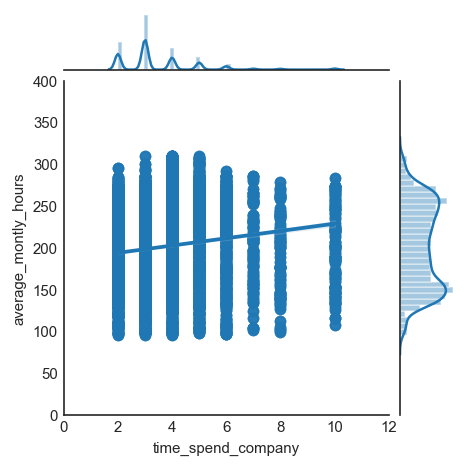

In [19]:
print('Зависимость среднего количества чаcов в месяц от стажа работы в компании (в годах)')
sns.jointplot('time_spend_company', 'average_montly_hours', data=data_set,
              kind='reg', 
              xlim=(0, 12), ylim=(0, 400),
              height=4)
plt.show()

Зависимость среднего количества чаcов в месяц от стажа работы в компании (в годах) с учетом уровня зарплалты ("salary")


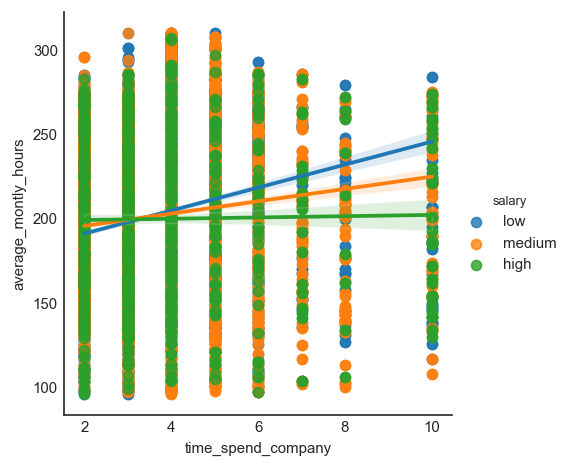

In [20]:
print('Зависимость среднего количества чаcов в месяц от стажа работы в компании (в годах) с учетом уровня зарплалты ("salary")')
sns.lmplot(x='time_spend_company', y='average_montly_hours',
           hue='salary', height=4,
           data=data_set)
plt.show()

Зависимость среднего количества чаcов в месяц от стажа работы в компании (в годах) с учетом отдела ("sales")


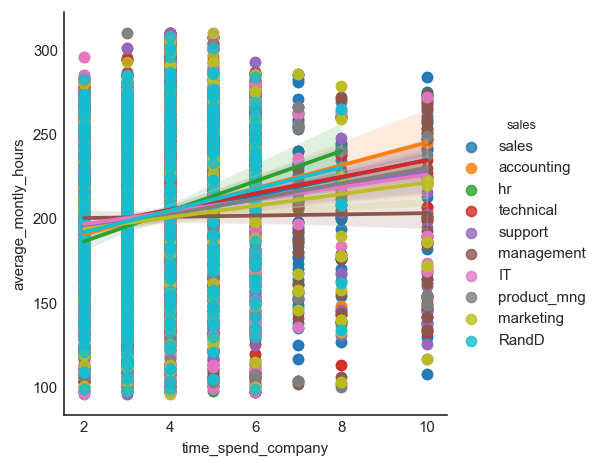

In [21]:
print('Зависимость среднего количества чаcов в месяц от стажа работы в компании (в годах) с учетом отдела ("sales")')
sns.lmplot(x='time_spend_company', y='average_montly_hours',
           hue='sales', height=4,
           data=data_set)
plt.show()

**>>> Можно предположить, что чем больше срок работы, тем больше у сотрудника в среднем рабочих часов в месяц**

### Задача 5: С использованием t-test статистики проверить взаимосвязи между несколькими переменными

**Зависимость уровня удовлетворенности по отделам**

In [22]:
# Создаем словарь, в котором ключ – наименовение отдела, а значение - список значений по отделу
dict_sales = {}
for dict_value in data_set['sales'].unique().tolist():
    dict_sales[dict_value] = data_set[data_set['sales'] == dict_value]['satisfaction_level']

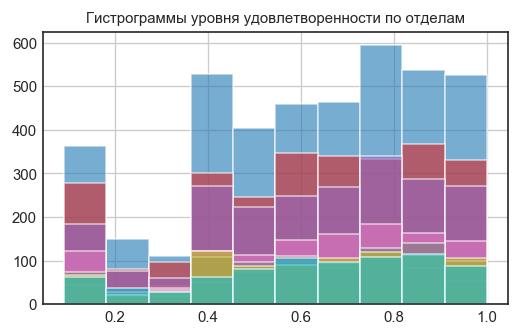

In [23]:
params = {'figure.figsize': (5, 3)}
plt.rcParams.update(params)

alpha = 0.6
dict_sales['sales'].hist(alpha=alpha)
dict_sales['accounting'].hist(alpha=alpha)
dict_sales['hr'].hist(alpha=alpha)
dict_sales['technical'].hist(alpha=alpha)
dict_sales['support'].hist(alpha=alpha)
dict_sales['management'].hist(alpha=alpha)
dict_sales['IT'].hist(alpha=alpha)
dict_sales['product_mng'].hist(alpha=alpha)
dict_sales['marketing'].hist(alpha=alpha)
dict_sales['RandD'].hist(alpha=alpha)
plt.title('Гистрограммы уровня удовлетворенности по отделам')
plt.show()

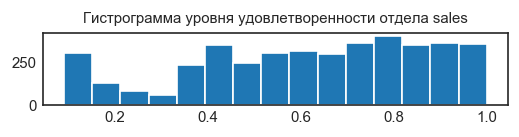

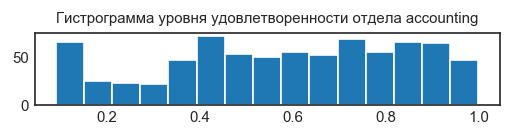

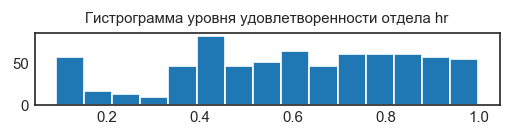

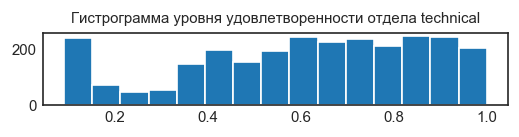

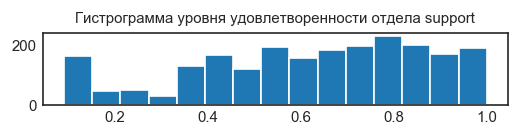

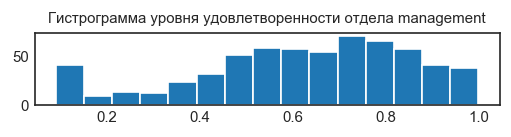

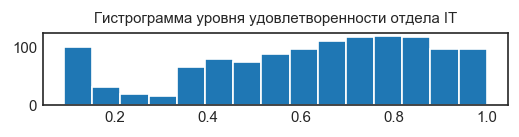

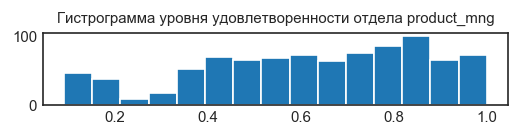

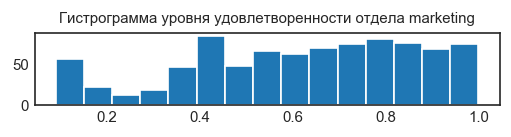

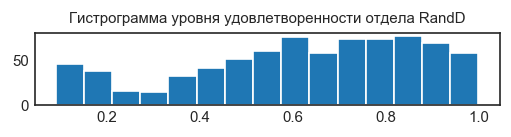

In [24]:
params = {'figure.figsize': (5, 0.8)}
plt.rcParams.update(params)

for dict_value in data_set['sales'].unique().tolist():
    plt.hist(dict_sales[dict_value], bins=15)
    plt.title(f'Гистрограмма уровня удовлетворенности отдела {dict_value}')
    plt.show()

In [25]:
# Используя тест ANOVA определяем есть ли статистическая разница между отделами
# (нулевая гипотиза, что математические ожидание (средние значения) в выборках совпадают)

statistic, pvalue = stats.f_oneway(dict_sales['sales'],
                                   dict_sales['accounting'],
                                   dict_sales['hr'],
                                   dict_sales['technical'],
                                   dict_sales['support'],
                                   dict_sales['management'],
                                   dict_sales['IT'],
                                   dict_sales['product_mng'],
                                   dict_sales['marketing'],
                                   dict_sales['RandD']
                                  )
print(f'Статистический критерий:\t{statistic}\np-value:\t{pvalue}')

Статистический критерий:	2.158432169180985
p-value:	0.021865375192711502


**p-value меньше alpha = 0.05, значит мы не можем статистически подтвердить нулевую гипотизу о том, что все выборки схожи между собой, скорее они отличаются**

**Посмотрим более детально визуально гистограмму по отделу IT и по всем другим отделам**

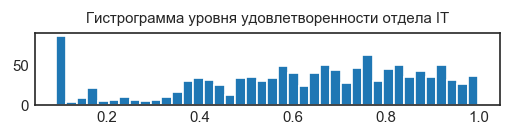

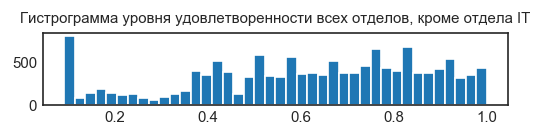

In [26]:
params = {'figure.figsize': (5, 0.8)}
plt.rcParams.update(params)

plt.hist(data_set[data_set['sales'] == 'IT']['satisfaction_level'], bins=40)
plt.title(f'Гистрограмма уровня удовлетворенности отдела IT')
plt.show()

plt.hist(data_set[data_set['sales'] != 'IT']['satisfaction_level'], bins=40)
plt.title(f'Гистрограмма уровня удовлетворенности всех отделов, кроме отдела IT')
plt.show()

**Для корректного расчета необходимо избавиться от выброса в начале гистограммы**

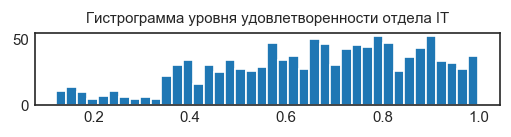

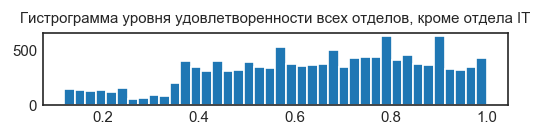

In [27]:
dict_sales_IT = data_set[(data_set['satisfaction_level']>0.11)&(data_set['sales'] == 'IT')]['satisfaction_level']
dict_sales_other =  data_set[(data_set['satisfaction_level']>0.11)&(data_set['sales'] != 'IT')]['satisfaction_level']

params = {'figure.figsize': (5, 0.8)}
plt.rcParams.update(params)

plt.hist(dict_sales_IT, bins=40)
plt.title(f'Гистрограмма уровня удовлетворенности отдела IT')
plt.show()

plt.hist(dict_sales_other, bins=40)
plt.title(f'Гистрограмма уровня удовлетворенности всех отделов, кроме отдела IT')
plt.show()

In [28]:
# Проверим схожесть выборки по отделу IT и всех других отделов

print('Число степеней сводобы:\t',len(dict_sales_IT)-1 + len(dict_sales_other)-1)
statistic, pvalue = stats.ttest_ind(dict_sales_IT, dict_sales_other)
print(f'Статистический критерий:\t{statistic}\np-value:\t{pvalue}')

Число степеней сводобы:	 14109
Статистический критерий:	2.009448363898998
p-value:	0.044508612346980926


**t-критерий выше табличного значения = 1.96... для доверительной вероятности = 0.95 при степени свободы = 14109, значит мы отвергаем нулевую гипотизу о том, что выборки схожи**

**p-value также меньше alpha=0.05, значит мы статистически не можем подтвердить нулевую гипотизу о том, что выборка по отделу IT cхожа с dыборкой по другим отделам (но очень близка)**

### Задача 6: Рассчитать сколько работников работает в каждом департаменте

In [29]:
# Вариант 1

print('Количество сотрудников в каждом отделе / департаменте:')

data_set['sales'].value_counts()

Количество сотрудников в каждом отделе / департаменте:


sales          4140
technical      2720
support        2229
IT             1227
product_mng     902
marketing       858
RandD           787
accounting      767
hr              739
management      630
Name: sales, dtype: int64

In [30]:
# Вариант 2

print('Количество сотрудников в каждом отделе / департаменте:')

total_count = 0
for dep in data_set['sales'].unique().tolist():
    print(f'– {dep}: {len(data_set[data_set.sales == dep])}')
    total_count += len(data_set[data_set.sales == dep])

print(f'Всего сотрудников: {total_count}')

Количество сотрудников в каждом отделе / департаменте:
– sales: 4140
– accounting: 767
– hr: 739
– technical: 2720
– support: 2229
– management: 630
– IT: 1227
– product_mng: 902
– marketing: 858
– RandD: 787
Всего сотрудников: 14999


In [31]:
# Вариант 3

print('Количество сотрудников в каждом отделе / департаменте:')

data_set.groupby('sales').size().reset_index(name='counts')

Количество сотрудников в каждом отделе / департаменте:


,sales,counts
0,IT,1227
1,RandD,787
2,accounting,767
3,hr,739
4,management,630
5,marketing,858
6,product_mng,902
7,sales,4140
8,support,2229
9,technical,2720


### Задача 7: Показать распределение сотрудников по зарплатам

In [32]:
print('Количество сотрудников c разным уровнем зарплаты:')

dt_salary = data_set.groupby('salary').size().reset_index(name='counts')
dt_salary

Количество сотрудников c разным уровнем зарплаты:


,salary,counts
0,high,1237
1,low,7316
2,medium,6446


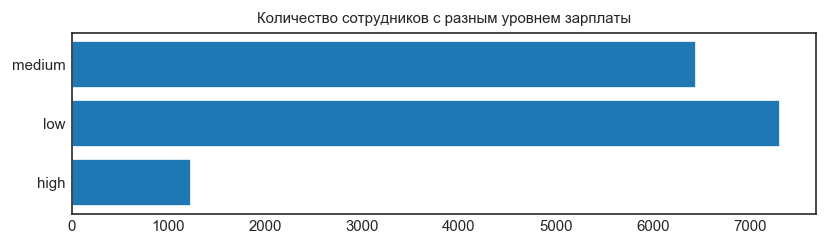

In [33]:
params = {'figure.figsize': (8, 2)}
plt.rcParams.update(params)

plt.barh(dt_salary['salary'], dt_salary['counts'])
plt.title('Количество сотрудников c разным уровнем зарплаты')
plt.show()

### Задача 8: Показать распределение сотрудников по зарплатам совместно с департаментами

In [34]:
print('Количество сотрудников c разным уровнем зарплаты в отделах / департаментах:')

dt_sales_salary = data_set.groupby(['sales', 'salary']).size().reset_index(name='counts')
dt_sales_salary

Количество сотрудников c разным уровнем зарплаты в отделах / департаментах:


,sales,salary,counts
0,IT,high,83
1,IT,low,609
2,IT,medium,535
3,RandD,high,51
4,RandD,low,364
5,RandD,medium,372
6,accounting,high,74
7,accounting,low,358
8,accounting,medium,335
9,hr,high,45


Количество сотрудников c разным уровнем зарплаты в отделах / департаментах


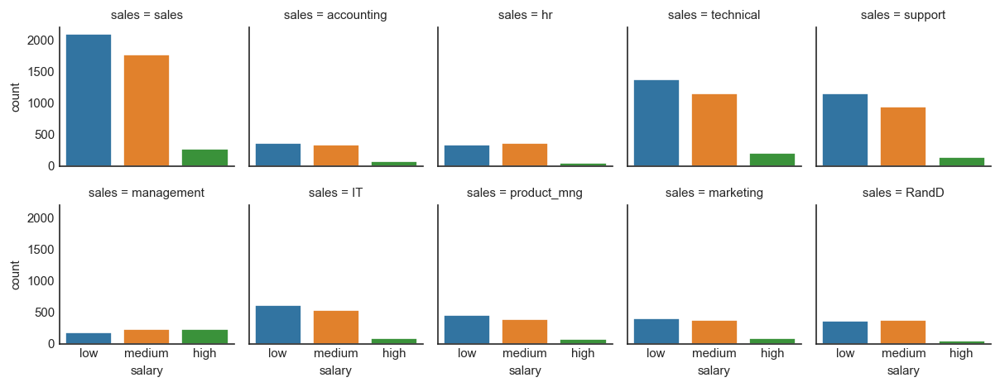

In [35]:
print('Количество сотрудников c разным уровнем зарплаты в отделах / департаментах')
    
sns.catplot('salary', col='sales',
            data=data_set, kind='count',
            col_wrap=5, height=2, aspect=1)

plt.show()

### Задача 9: Сколько сотрудников покинули компанию

In [36]:
print(f'Компанию покинуло {len(data_set[data_set.left == True])} сотрудников.')

Компанию покинуло 3571 сотрудников.


### Задача 10: Проверить несколько гипотез для данных, чтобы понять почему сотрудники покидают компанию

In [37]:
# Создаем две выборки: работающие сотрудники и уволенные сотрудники

dt_staffers = data_set[data_set.left == False]
dt_left_staffers = data_set[data_set.left == True]

print(f'Размер выборки работающих сотрудников:\t{len(dt_staffers)}\nРазмер выборки уволенных сотрудников:\t{len(dt_left_staffers)}')

Размер выборки работающих сотрудников:	11428
Размер выборки уволенных сотрудников:	3571


**Гипотеза 1: Увольняются сотрудники, которые мало проработали (не вжились в коллектив /  не понравилась работа) – нулевая гипотиза, или увольняются сотрудники, которые долго проработали (усталость от одного и того же места работы) – альтернативаная гипотиза**

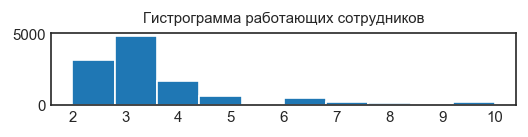

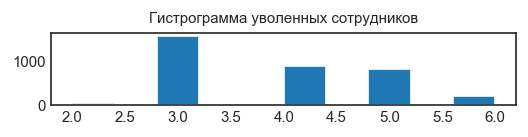

In [38]:
params = {'figure.figsize': (5, 0.8)}
plt.rcParams.update(params)

plt.hist(dt_staffers['time_spend_company'])
plt.title(f'Гистрограмма работающих сотрудников')
plt.show()

plt.hist(dt_left_staffers['time_spend_company'])
plt.title(f'Гистрограмма уволенных сотрудников')
plt.show()

Распределения скорей не нормальное, поэтому лучше использовать критерий Манна-Уитни

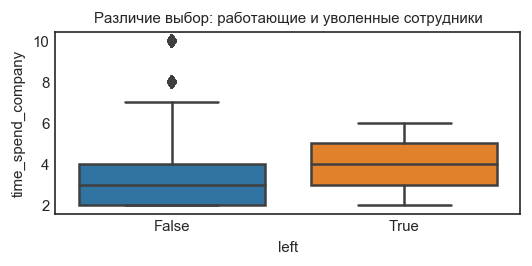

In [39]:
params = {'figure.figsize': (5, 2)}
plt.rcParams.update(params)

sns.boxplot(x=data_set['left'], y=data_set['time_spend_company'])
plt.title(f'Различие выбор: работающие и уволенные сотрудники')
plt.show()

In [40]:
statistic, pvalue = stats.mannwhitneyu(dt_staffers['time_spend_company'], dt_left_staffers['time_spend_company'])
print(f'p-value: {round(pvalue, 3)}')

p-value: 0.0


**p-value меньше aplpa = 0.05, значит мы не можем подтвердить нулевую гипотизу – увольняются сотрудники, которые мало проработали.**

**>>> Вывод: Чаще увольняются сотрудники с большим стажем работы**

**Гипотеза 2: Увольняются сотрудники, у которых не было повышения за последние 5 лет – нулевая гипотиза**

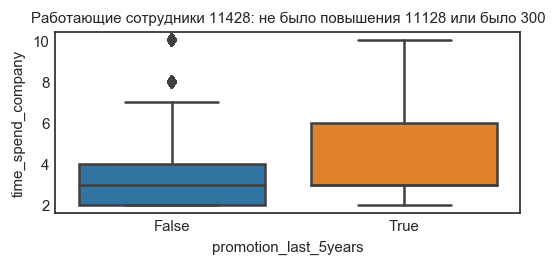

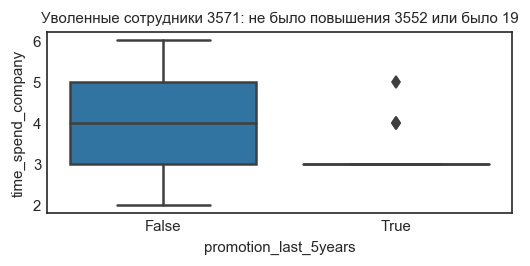

In [41]:
params = {'figure.figsize': (5, 2)}
plt.rcParams.update(params)

sns.boxplot(x=dt_staffers['promotion_last_5years'], y=data_set['time_spend_company'])
plt.title(f'Работающие сотрудники {len(dt_staffers)}: не было повышения {len(dt_staffers[dt_staffers.promotion_last_5years == False])} или было {len(dt_staffers[dt_staffers.promotion_last_5years == True])}')
plt.show()

sns.boxplot(x=dt_left_staffers['promotion_last_5years'], y=data_set['time_spend_company'])
plt.title(f'Уволенные сотрудники {len(dt_left_staffers)}: не было повышения {len(dt_left_staffers[dt_left_staffers.promotion_last_5years == False])} или было {len(dt_left_staffers[dt_left_staffers.promotion_last_5years == True])}')
plt.show()

In [42]:
# Уволился и было повышение
dt_temp1 = data_set[(data_set['left'] == True)&(data_set['promotion_last_5years'] == True)]['time_spend_company']
# Уволился и не было повышения
dt_temp2 = data_set[(data_set['left'] == True)&(data_set['promotion_last_5years'] == False)]['time_spend_company']
# Работает и было повышение
dt_temp3 = data_set[(data_set['left'] == False)&(data_set['promotion_last_5years'] == True)]['time_spend_company']
# Работает и не было повышения
dt_temp4 = data_set[(data_set['left'] == False)&(data_set['promotion_last_5years'] == False)]['time_spend_company']

# Проверяем, что выборки уволившихся и работающих, у которых было повышение схожие
statistic, pvalue = stats.ttest_ind(dt_temp1, dt_temp3)
print('Проверяем, что выборки уволившихся и работающих, у которых было повышение схожие:')
if pvalue >= 0.05:
    print(f'p-value: {round(pvalue, 3)}: выборки похожи')
else:
    print(f'p-value: {round(pvalue, 3)}: выборки не похожи')

# Проверяем, что выборки уволившихся и работающих, у которых не было повышения схожие
statistic, pvalue = stats.ttest_ind(dt_temp2, dt_temp4)
print('\nПроверяем, что выборки уволившихся и работающих, у которых не было повышения схожие:')
if pvalue >= 0.05:
    print(f'p-value: {round(pvalue, 3)}: выборки похожи')
else:
    print(f'p-value: {round(pvalue, 3)}: выборки не похожи')
    
# Проверяем, что выборки уволившихся, у которых было повышени и у которых не было схожие
statistic, pvalue = stats.ttest_ind(dt_temp1, dt_temp2)
print('\nПроверяем, что выборки уволившихся, у которых было повышени и у которых не было схожие:')
if pvalue >= 0.05:
    print(f'p-value: {round(pvalue, 3)}: выборки похожи')
else:
    print(f'p-value: {round(pvalue, 3)}: выборки не похожи')
    
# Проверяем, что выборки работующих, у которых было повышени и у которых не было схожие
statistic, pvalue = stats.ttest_ind(dt_temp3, dt_temp4)
print('\nПроверяем, что выборки работающих, у которых было повышени и у которых не было схожие:')
if pvalue >= 0.05:
    print(f'p-value: {round(pvalue, 3)}: выборки похожи')
else:
    print(f'p-value: {round(pvalue, 3)}: выборки не похожи')

Проверяем, что выборки уволившихся и работающих, у которых было повышение схожие:
p-value: 0.06: выборки похожи

Проверяем, что выборки уволившихся и работающих, у которых не было повышения схожие:
p-value: 0.0: выборки не похожи

Проверяем, что выборки уволившихся, у которых было повышени и у которых не было схожие:
p-value: 0.006: выборки не похожи

Проверяем, что выборки работающих, у которых было повышени и у которых не было схожие:
p-value: 0.0: выборки не похожи


**>>> Вывод: Увольнение работников не зависит от повышения**

### Задача 11: Загрузить результат (в формате .ipynb ноутбука) в репозиторий. Разместить ссылку на репозиторий в Личном кабинете

**Выполнено! ;-)**